In [ ]:
#importing libraries
import numpy as np
import skimage.util 
import skimage
from skimage import filters
import cv2 as cv
from PIL import Image,ImageOps
from matplotlib.pyplot import imshow,title,figure
from matplotlib import pyplot as plt
import math
from scipy import ndimage, misc
import scipy
from skimage import io,color
from skimage.color import rgb2lab, lab2rgb
from skimage.filters import rank
from skimage.morphology import disk
from skimage.morphology import ball
%matplotlib inline

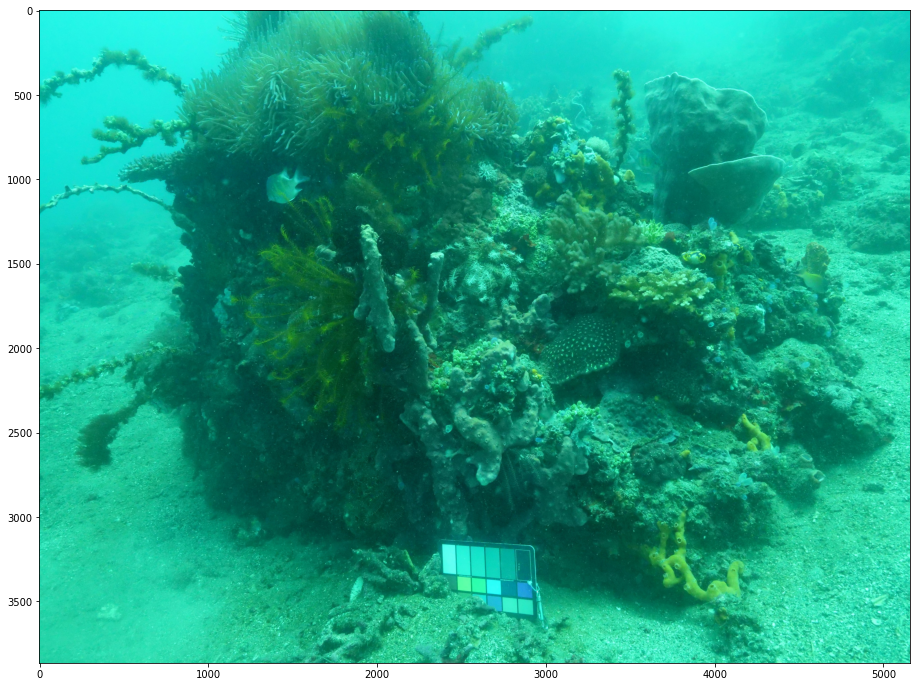

In [ ]:
#reading image
img = cv.imread('wotah.jpg')
img2 = img[:,:,::-1]

#displaying image
figure(figsize = (22,12))
imshow(img2)

#splitting r,g,b channels for contrast adjustment
(b, g, r)    = cv.split(img)

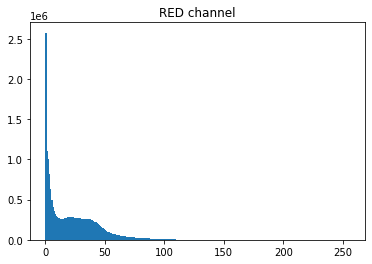

In [ ]:
#analyzing red channels
flattened_r = r.ravel() 
plt.hist(flattened_r,256,[0,256]) 
plt.title("RED channel")  
plt.show()

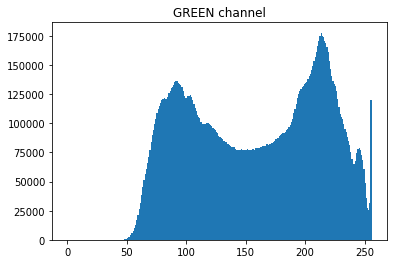

In [ ]:
#analyzing green channels
flattened_g = g.ravel() 
plt.hist(flattened_g,256,[0,256]) 
plt.title("GREEN channel")  
plt.show()

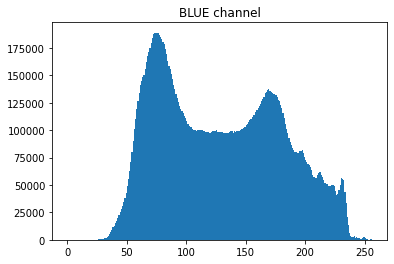

In [ ]:
#analyzing blue channels
flattened_b = b.ravel() 
plt.hist(flattened_b,256,[0,256]) 
plt.title("BLUE channel")  
plt.show()

In [ ]:
#contrast adjustment with CLAHE 

#for low contrast narrow shifted left red channel and good contrast greens and blues
clahe = cv.createCLAHE(clipLimit=6, tileGridSize=(4,4))
r_clahe = clahe.apply(r)
clahe = cv.createCLAHE(clipLimit=1, tileGridSize=(2,2))
g_clahe = clahe.apply(g)
clahe = cv.createCLAHE(clipLimit=1, tileGridSize=(2,2))
b_clahe = clahe.apply(b)

#for all channels low contrasted
# clahe = cv.createCLAHE(clipLimit=4, tileGridSize=(4,4))
# r_clahe = clahe.apply(r)
# clahe = cv.createCLAHE(clipLimit=4, tileGridSize=(4,4))
# g_clahe = clahe.apply(g)
# clahe = cv.createCLAHE(clipLimit=4, tileGridSize=(6,6))
# b_clahe = clahe.apply(b)


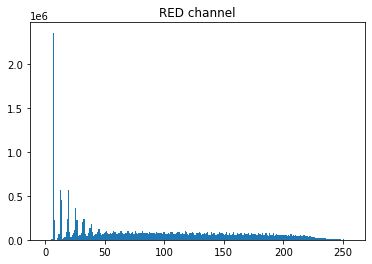

In [ ]:
#contrast adjusted red channel
flattened_r = r_clahe.ravel() 
plt.hist(flattened_r,256,[0,256]) 
plt.title("RED channel")  
plt.show()

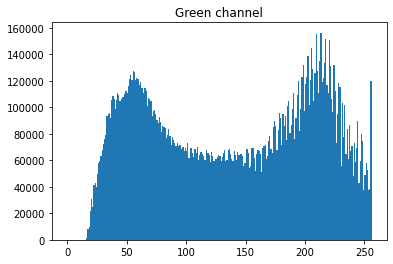

In [ ]:
#contrast adjusted green channel
flattened_g = g_clahe.ravel() 
plt.hist(flattened_g,256,[0,256]) 
plt.title("Green channel")  
plt.show()

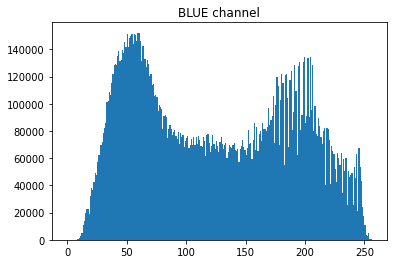

In [ ]:
#contrast adjusted blue channel
flattened_b = b_clahe.ravel() 
plt.hist(flattened_b,256,[0,256]) 
plt.title("BLUE channel")  
plt.show()

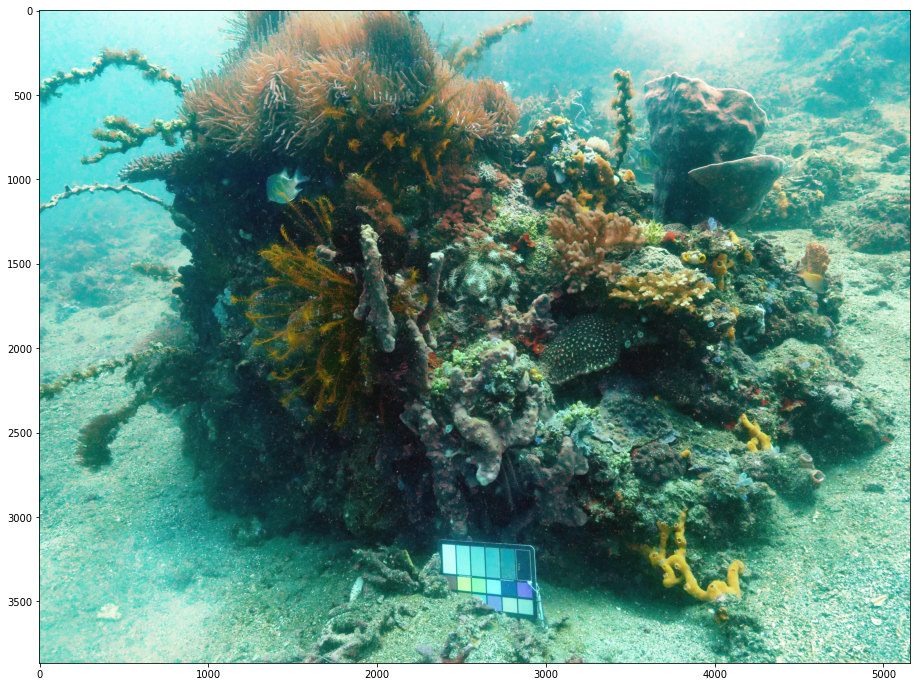

In [ ]:
#merging reed,green,blue channels to get rgb image
merged = cv.merge([b_clahe, g_clahe, r_clahe])
img3 = merged[:,:,::-1]
figure(figsize = (22,12))
imshow(img3)

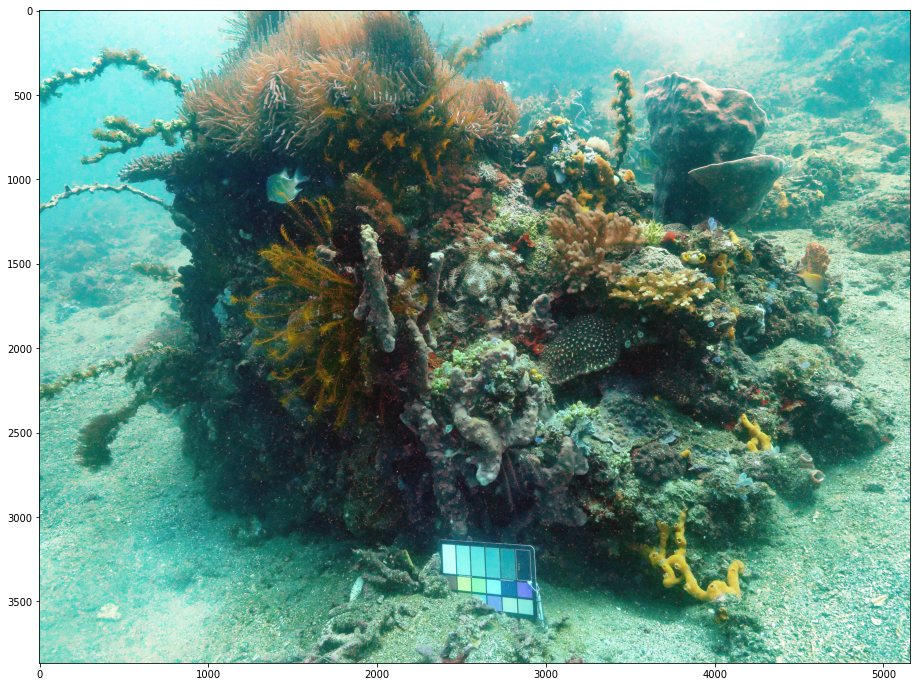

In [ ]:
#sharpening the edges 

kernelsharp = np.array([[0, -1, 0],
                        [-1, 5,-1],
                        [0, -1, 0]])
image_sharp = cv.filter2D(src=img3, ddepth=-1, kernel=kernelsharp)
figure(figsize = (22,12))
imshow(image_sharp)

In [ ]:
#saving image
cv.imwrite('1contrasted.jpg', merged)

True

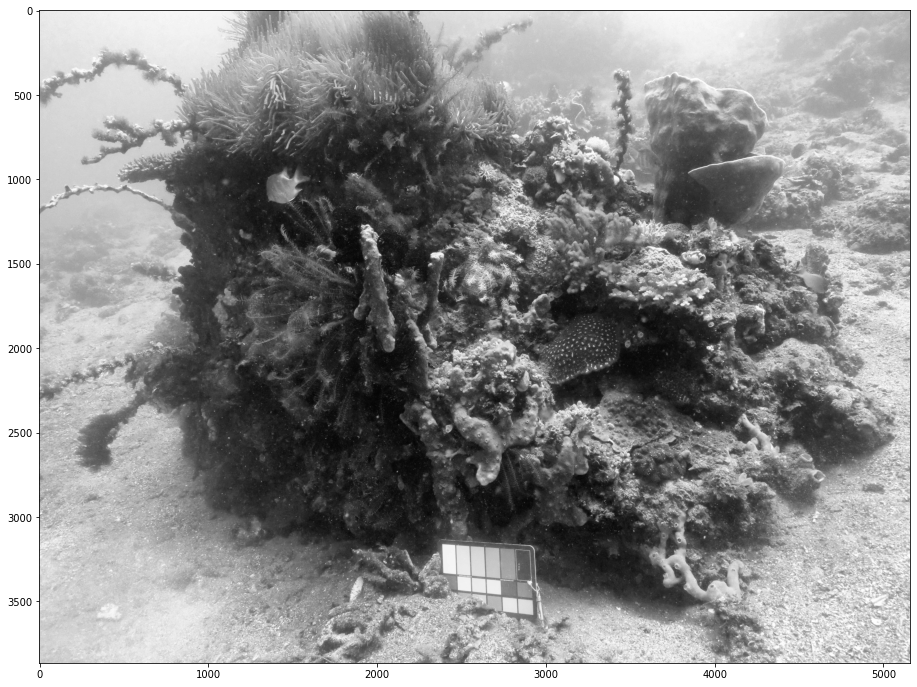

In [ ]:
#opening image
rgb = io.imread('1contrasted.jpg')

#converting into lab color space
lab = color.rgb2lab(rgb)

#creating a copy to preserve color channels
labcopy = np.copy(lab)

#converting into grayscale
labcopy[...,1] = labcopy[...,2] = 0
figure(figsize = (22,12))
imshow(labcopy[...,0],cmap='gray')

In [ ]:
# creating a blurred copy for masking
imageL = np.copy(labcopy[...,0].astype(np.uint8))
gausBlur = cv.GaussianBlur(imageL, (15,15),0) 

#using the blur image for creating mask
ret, thresh = cv.threshold(gausBlur,0,255,cv.THRESH_BINARY_INV+cv.THRESH_OTSU)

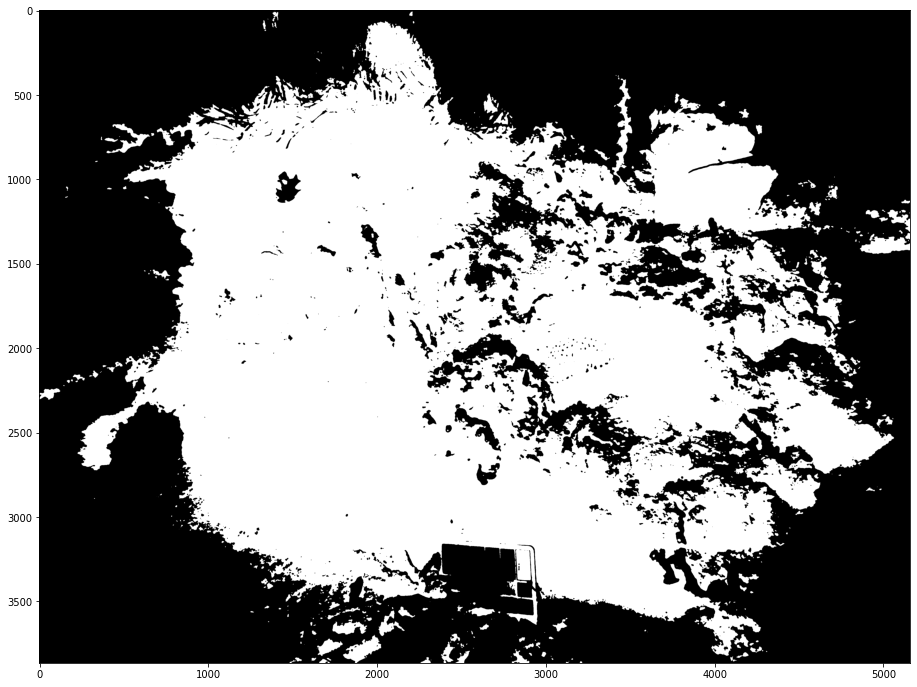

In [ ]:
#viewing mask
figure(figsize = (22,12))
imshow(thresh,cmap='gray')

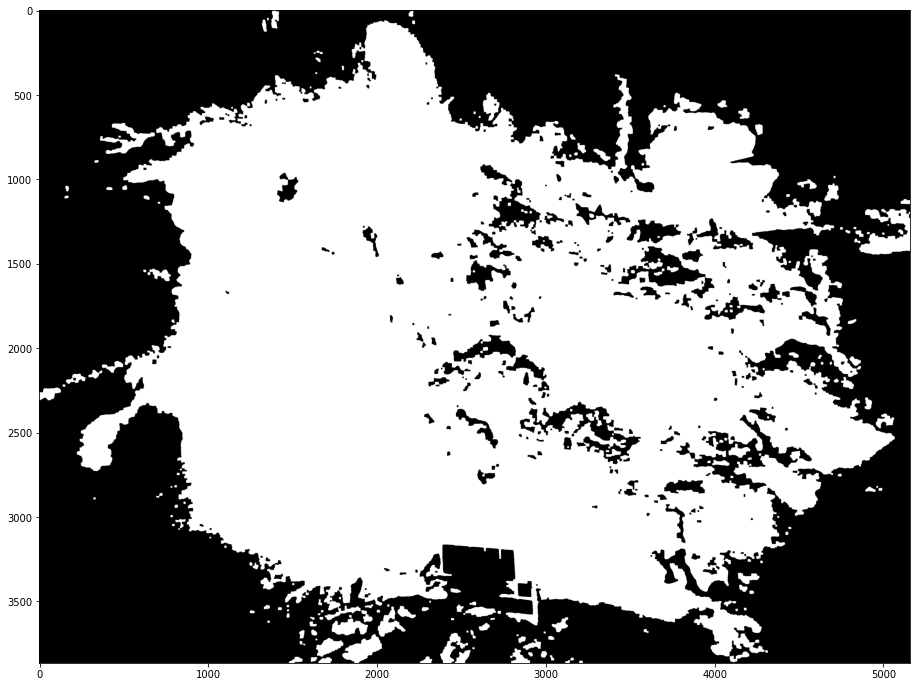

In [ ]:
#dilating and eroding the mask for better coverage

# some images might need closing, some just dilation
#kernel size can vary too for each image
kernel = np.ones((9,9), np.uint8)
img_dilated = cv.dilate(thresh, kernel, iterations=2)
img_erod = cv.erode(img_dilated, kernel, iterations=1)
figure(figsize = (22,12))
imshow(img_erod,cmap='gray')

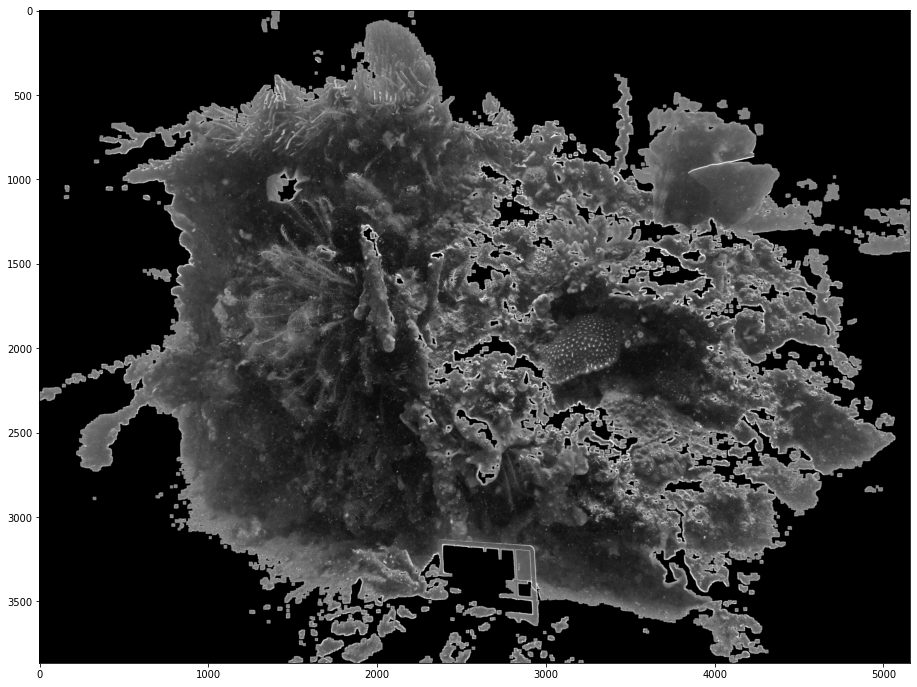

In [ ]:
#extracting foreground

#here erosion or dilation variable depending on image foreground
fg = img_dilated & imageL
figure(figsize = (22,12))
imshow(fg,cmap='gray')

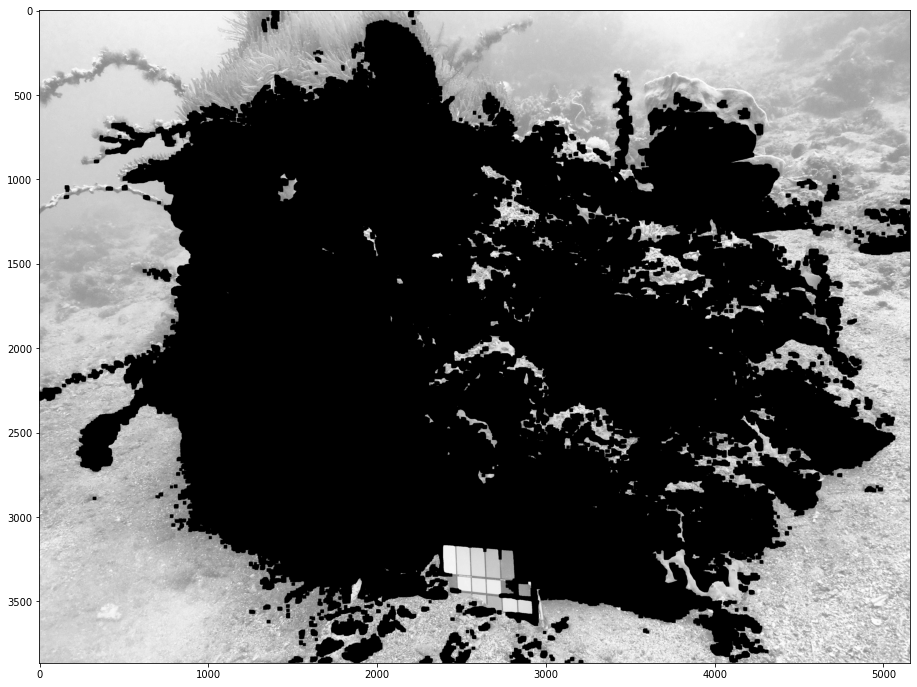

In [ ]:
#separating backgrond for contrast adjustment

#here erosion or dilation variable depending on image foreground
bg = (~img_dilated) & imageL
figure(figsize = (22,12))
imshow(bg,cmap='gray')

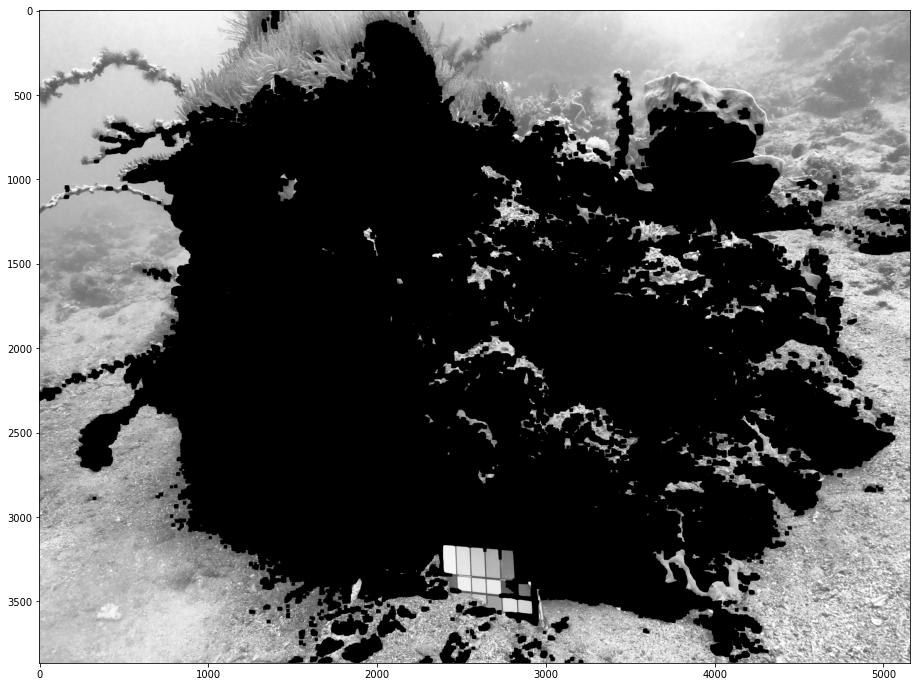

In [ ]:
#adjusting contrast of background 
clahe = cv.createCLAHE(clipLimit=1, tileGridSize=(2,2))

#clahe maybe applied to bg or fg depeding on image type
bg_clahe = clahe.apply(bg)
figure(figsize = (22,12))
imshow(bg_clahe,cmap='gray')

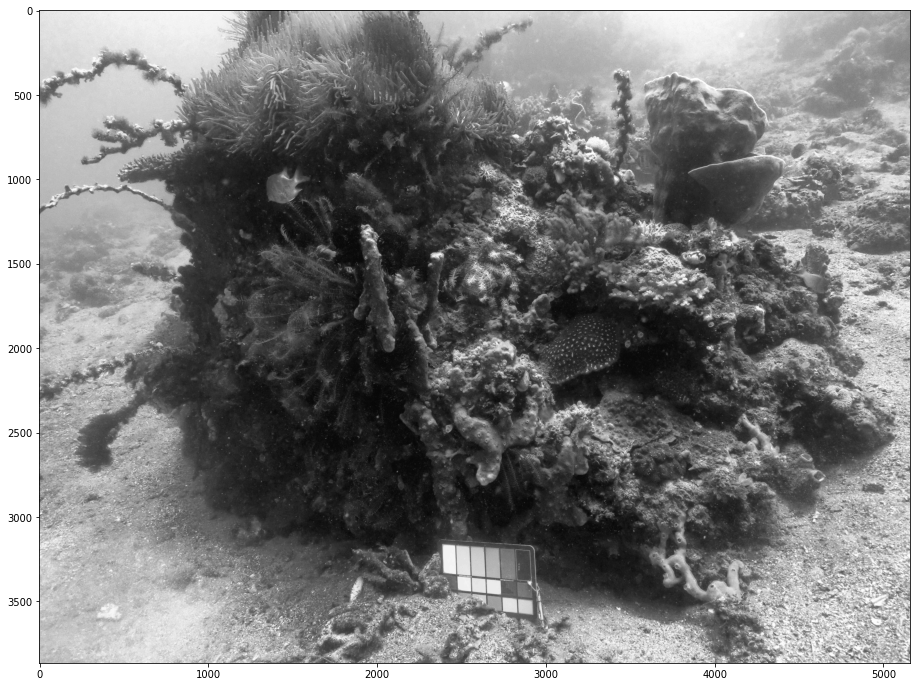

In [ ]:
#apply OR to foreground and background to merge the image

image_enhanced = bg_clahe | fg #that variable maybe bg or fg depeniding on image
figure(figsize = (22,12))
imshow(image_enhanced,cmap='gray')

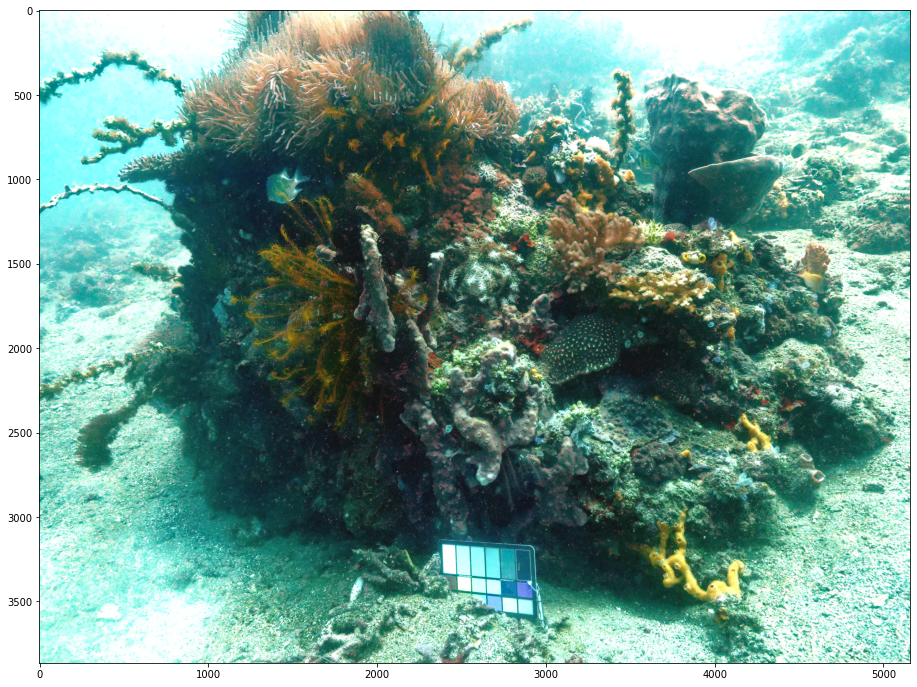

In [ ]:
#replacing the preserved color back to get rgb image

labcopy[...,0] = image_enhanced
labcopy[...,1] = lab[...,1]
labcopy[...,2] = lab[...,2]

#final output
invertedlab = color.lab2rgb(labcopy)
figure(figsize = (22,12))
imshow(invertedlab)